## EDA of cadiovascular diseases data 

This work is my first public Kernel in Kaggle, and I would really appreciate your feedback or upvote!

The dataset consists of 70 000 records of patients data in 12 features, such as age, gender, systolic blood pressure, diastolic blood pressure, and etc. The target class "cardio" equals to 1, when patient has cardiovascular desease, and it's 0, if patient is healthy.

The task is to predict the presence or absence of cardiovascular disease (CVD) using the patient examination results. 

#### Data description

There are 3 types of input features:

- *Objective*: factual information;
- *Examination*: results of medical examination;
- *Subjective*: information given by the patient.

| Feature | Variable Type | Variable      | Value Type |
|---------|--------------|---------------|------------|
| Age | Objective Feature | age | int (days) |
| Height | Objective Feature | height | int (cm) |
| Weight | Objective Feature | weight | float (kg) |
| Gender | Objective Feature | gender | categorical code |
| Systolic blood pressure | Examination Feature | ap_hi | int |
| Diastolic blood pressure | Examination Feature | ap_lo | int |
| Cholesterol | Examination Feature | cholesterol | 1: normal, 2: above normal, 3: well above normal |
| Glucose | Examination Feature | gluc | 1: normal, 2: above normal, 3: well above normal |
| Smoking | Subjective Feature | smoke | binary |
| Alcohol intake | Subjective Feature | alco | binary |
| Physical activity | Subjective Feature | active | binary |
| Presence or absence of cardiovascular disease | Target Variable | cardio | binary |

All of the dataset values were collected at the moment of medical examination. 


### Initial analysis
Let's look at the dataset and given variables.

In [ ]:
!ls -ltGh

total 12256
-rw-r--r--@ 1 neba  staff   254K 16 Aug 08:50 eda-cardiovascular-data.ipynb
-rw-r--r--@ 1 neba  staff   162B 16 Aug 08:33 ~$ploratory Data Analysis_HDR-UK_Group5.docx
-rw-r--r--@ 1 neba  staff   227K 16 Aug 08:33 Exploratory Data Analysis_HDR-UK_Group5.docx
-rw-r--r--@ 1 neba  staff    72K 16 Aug 08:20 data-science-and-cardiovascular-diseases-cvds.ipynb
-rw-r--r--@ 1 neba  staff   2.5M 12 Aug 10:08 preprocessed_data (1).csv
-rw-r--r--@ 1 neba  staff   147K 12 Aug 09:53 Untitled.ipynb
-rw-rw-r--@ 1 neba  staff   2.8M 17 Oct  2019 cardio_train.csv


In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
from matplotlib import pyplot as plt
import os
df = pd.read_csv("cardio_train.csv",sep=";")

In [ ]:
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


#### Univariate analysis
To understand all our variables, at first, we should look at their datatypes. We can do it with `info()` function:

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           70000 non-null  int64  
 1   age          70000 non-null  int64  
 2   gender       70000 non-null  int64  
 3   height       70000 non-null  int64  
 4   weight       70000 non-null  float64
 5   ap_hi        70000 non-null  int64  
 6   ap_lo        70000 non-null  int64  
 7   cholesterol  70000 non-null  int64  
 8   gluc         70000 non-null  int64  
 9   smoke        70000 non-null  int64  
 10  alco         70000 non-null  int64  
 11  active       70000 non-null  int64  
 12  cardio       70000 non-null  int64  
dtypes: float64(1), int64(12)
memory usage: 6.9 MB


In [ ]:
# Subsetting five most important columns based on Veronica's predictions
df2 = df[["age", "ap_hi", "weight", "height", "ap_lo", "cholesterol"]]
df2

,age,ap_hi,weight,height,ap_lo,cholesterol
0,18393,110,62.0,168,80,1
1,20228,140,85.0,156,90,3
2,18857,130,64.0,165,70,3
3,17623,150,82.0,169,100,1
4,17474,100,56.0,156,60,1
...,...,...,...,...,...,...
69994,21074,150,80.0,165,80,1
69995,19240,120,76.0,168,80,1
69996,22601,140,126.0,158,90,2
69998,22431,135,72.0,163,80,1


All features are numerical, 12 integers and 1 decimal number (weight). The second column gives us an idea how big is the dataset and how many non-null values are there for each field. We can use `describe()` to display sample statistics such as `min`, `max`, `mean`,`std` for each attribute:

In [ ]:
 #summary statistics
summa_stats = df2.describe()
summa_stats.to_csv("summary_stats.csv")
summa_stats

,age,ap_hi,weight,height,ap_lo
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,19468.865814,128.817286,74.205690,164.359229,96.630414
std,2467.251667,154.011419,14.395757,8.210126,188.472530
min,10798.000000,-150.000000,10.000000,55.000000,-70.000000
25%,17664.000000,120.000000,65.000000,159.000000,80.000000
50%,19703.000000,120.000000,72.000000,165.000000,80.000000
75%,21327.000000,140.000000,82.000000,170.000000,90.000000
max,23713.000000,16020.000000,200.000000,250.000000,11000.000000


In [ ]:
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [ ]:
#Converting age from days to years
df['age_years'] = (df['age'] / 365).round().astype('int')
df

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,years,age_years
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0,50,50
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,55,55
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,52,52
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1,48,48
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0,48,48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,99993,19240,2,168,76.0,120,80,1,1,1,0,1,0,53,53
69996,99995,22601,1,158,126.0,140,90,2,2,0,0,1,1,62,62
69997,99996,19066,2,183,105.0,180,90,3,1,0,1,0,1,52,52
69998,99998,22431,1,163,72.0,135,80,1,2,0,0,0,1,61,61


In [ ]:
df.describe()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,years,age_years
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,49972.419900,19468.865814,1.349571,164.359229,74.205690,128.817286,96.630414,1.366871,1.226457,0.088129,0.053771,0.803729,0.499700,53.338686,53.338686
std,28851.302323,2467.251667,0.476838,8.210126,14.395757,154.011419,188.472530,0.680250,0.572270,0.283484,0.225568,0.397179,0.500003,6.765294,6.765294
min,0.000000,10798.000000,1.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,30.000000,30.000000
25%,25006.750000,17664.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,48.000000,48.000000
50%,50001.500000,19703.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,54.000000,54.000000
75%,74889.250000,21327.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000,58.000000,58.000000
max,99999.000000,23713.000000,2.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000,65.000000,65.000000


In [ ]:
#Binning age
def define_ageBands(age_years):
    if age_years<=29:
        return "<30"
    elif age_years >29 and age_years<=39:
        return "30 to 39"
    elif age_years >39 and age_years<=49:
        return "40 to 49"
    elif age_years >49 and age_years<=59:
        return "50 to 59"
    elif age_years >59:
        return "=>50"

    else:
        return ""

    
df["age_bands"]=df["age_years"].apply(define_ageBands)
df

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,years,age_years,Age_bands,age_bands,NewGender,Gender,Gender2
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0,50,50,40 to 54,50 to 59,male,male,1
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,55,55,>55,50 to 59,female,female,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,52,52,40 to 54,50 to 59,female,female,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1,48,48,40 to 54,40 to 49,male,male,1
8,13,17668,1,158,71.0,110,70,1,1,0,0,1,0,48,48,40 to 54,40 to 49,female,female,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69993,99991,19699,1,172,70.0,130,90,1,1,0,0,1,1,54,54,40 to 54,50 to 59,female,female,1
69994,99992,21074,1,165,80.0,150,80,1,1,0,0,1,1,58,58,>55,50 to 59,female,female,1
69995,99993,19240,2,168,76.0,120,80,1,1,1,0,1,0,53,53,40 to 54,50 to 59,male,male,1
69998,99998,22431,1,163,72.0,135,80,1,2,0,0,0,1,61,61,>55,=>50,female,female,1


In [ ]:
#adding column with gender name as male or female
def decode_gender(gender):
    if gender ==2:
        return "male"
    elif gender==1:
        return "female"
    else:
        return ""

    
df["Gender"]=df["gender"].apply(decode_gender)
df

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,years,age_years,Age_bands,age_bands,NewGender,Gender
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0,50,50,40 to 54,50 to 59,male,male
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,55,55,>55,50 to 59,female,female
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,52,52,40 to 54,50 to 59,female,female
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1,48,48,40 to 54,40 to 49,male,male
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0,48,48,40 to 54,40 to 49,female,female
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,99993,19240,2,168,76.0,120,80,1,1,1,0,1,0,53,53,40 to 54,50 to 59,male,male
69996,99995,22601,1,158,126.0,140,90,2,2,0,0,1,1,62,62,>55,=>50,female,female
69997,99996,19066,2,183,105.0,180,90,3,1,0,1,0,1,52,52,40 to 54,50 to 59,male,male
69998,99998,22431,1,163,72.0,135,80,1,2,0,0,0,1,61,61,>55,=>50,female,female


In [ ]:
def gender2(gender):
    if gender ==2:
        return "1"
    elif gender==1:
        return "1"
    else:
        return ""

    
df["Gender2"]=df["gender"].apply(gender2)
df.to_csv("df2.csv")

my_types = {
    "Gender2": "int64",
}

df2=pd.read_csv("df2.csv")
df2

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45258 entries, 0 to 45257
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   45258 non-null  int64  
 1   id           45258 non-null  int64  
 2   age          45258 non-null  int64  
 3   gender       45258 non-null  int64  
 4   height       45258 non-null  int64  
 5   weight       45258 non-null  float64
 6   ap_hi        45258 non-null  int64  
 7   ap_lo        45258 non-null  int64  
 8   cholesterol  45258 non-null  int64  
 9   gluc         45258 non-null  int64  
 10  smoke        45258 non-null  int64  
 11  alco         45258 non-null  int64  
 12  active       45258 non-null  int64  
 13  cardio       45258 non-null  int64  
 14  years        45258 non-null  int64  
 15  age_years    45258 non-null  int64  
 16  Age_bands    45258 non-null  object 
 17  age_bands    45258 non-null  object 
 18  NewGender    45258 non-null  object 
 19  Gend

In [ ]:
data = df2.groupby("Gender")["Gender2"].sum()
data

Gender
female    29731
male      15527
Name: Gender2, dtype: int64

(-1.25, 1.25, -1.25, 1.25)

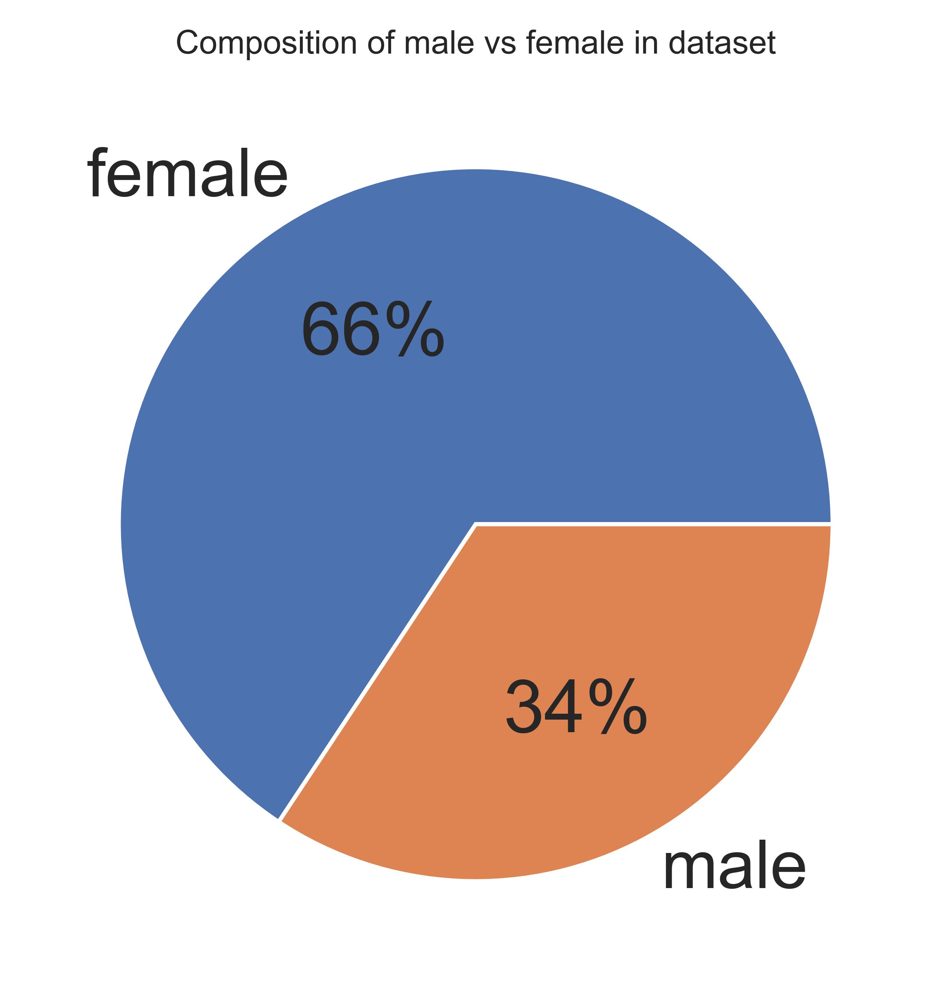

In [ ]:
data.plot.pie(autopct="%.0f%%");
plt.title("Composition of male vs female in dataset", fontsize=8);
plt.axis('off')

In [ ]:
def renameCardio(cardio):
    if cardio ==0:
        return "Healthy"
    elif cardio==1:
        return "Cardiovascular disease"
    else:
        return ""

df["CVD status"]=df["cardio"].apply(renameCardio)
df

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,...,years,age_years,Age_bands,age_bands,NewGender,Gender,Gender2,cardio_names,BMI,CVD status
0,0,18393,2,168,62.0,110,80,1,1,0,...,50,50,40 to 54,50 to 59,male,male,1,Healthy,21.967120,Healthy
1,1,20228,1,156,85.0,140,90,3,1,0,...,55,55,>55,50 to 59,female,female,1,Cardiovascular disease,34.927679,Cardiovascular disease
2,2,18857,1,165,64.0,130,70,3,1,0,...,52,52,40 to 54,50 to 59,female,female,1,Cardiovascular disease,23.507805,Cardiovascular disease
3,3,17623,2,169,82.0,150,100,1,1,0,...,48,48,40 to 54,40 to 49,male,male,1,Cardiovascular disease,28.710479,Cardiovascular disease
8,13,17668,1,158,71.0,110,70,1,1,0,...,48,48,40 to 54,40 to 49,female,female,1,Healthy,28.440955,Healthy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69993,99991,19699,1,172,70.0,130,90,1,1,0,...,54,54,40 to 54,50 to 59,female,female,1,Cardiovascular disease,23.661439,Cardiovascular disease
69994,99992,21074,1,165,80.0,150,80,1,1,0,...,58,58,>55,50 to 59,female,female,1,Cardiovascular disease,29.384757,Cardiovascular disease
69995,99993,19240,2,168,76.0,120,80,1,1,1,...,53,53,40 to 54,50 to 59,male,male,1,Healthy,26.927438,Healthy
69998,99998,22431,1,163,72.0,135,80,1,2,0,...,61,61,>55,=>50,female,female,1,Cardiovascular disease,27.099251,Cardiovascular disease


In [ ]:
data2=df["cardio_names"].value_counts()
data2

Healthy                   23621
Cardiovascular disease    21637
Name: cardio_names, dtype: int64

(-1.25, 1.25, -1.25, 1.25)

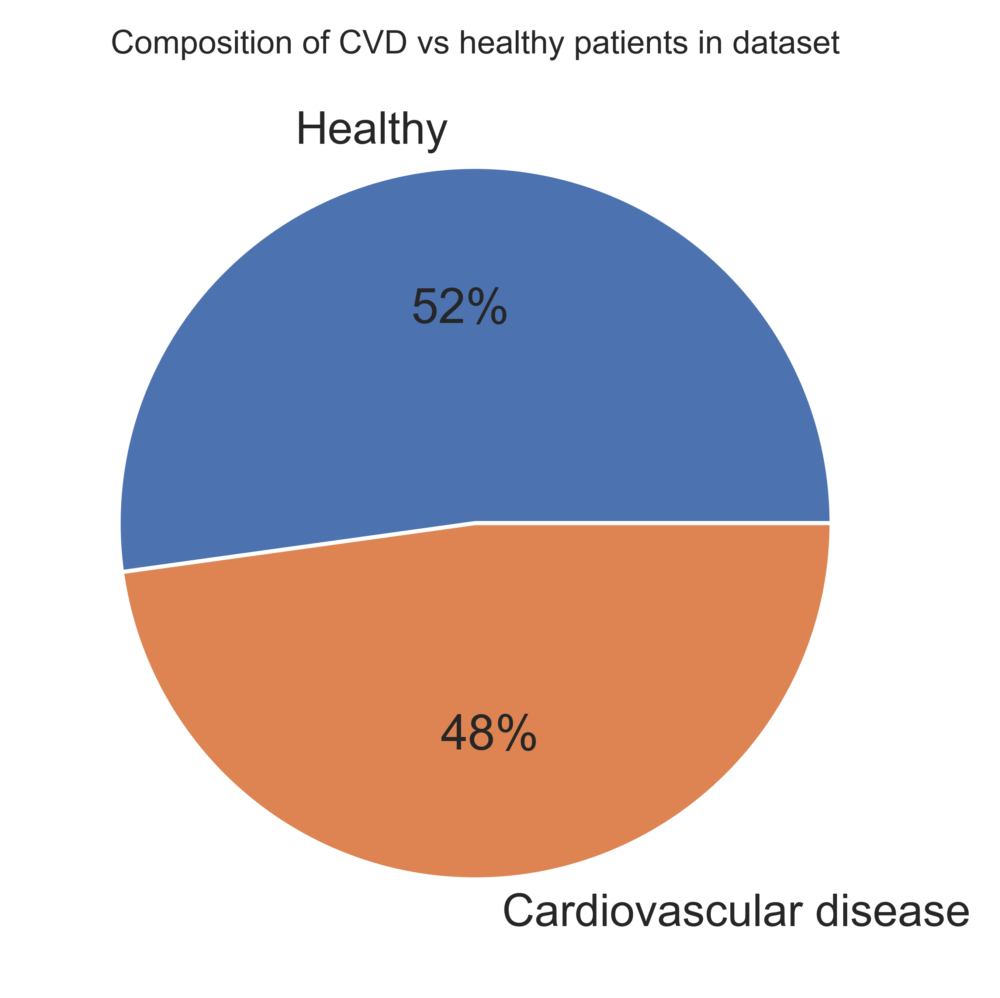

In [ ]:
curent_palette = sns.color_palette()
sns.set(font_scale = 1)
data2.plot.pie(autopct="%.0f%%");
plt.title("Composition of CVD vs healthy patients in dataset", fontsize=8);
plt.axis('off')


In [ ]:
df3=pd.crosstab(df['cardio'],df['Gender'],normalize=False)
df4=df3.T
df4

cardio,0,1
Gender,,
female,21774,20875
male,11717,11206


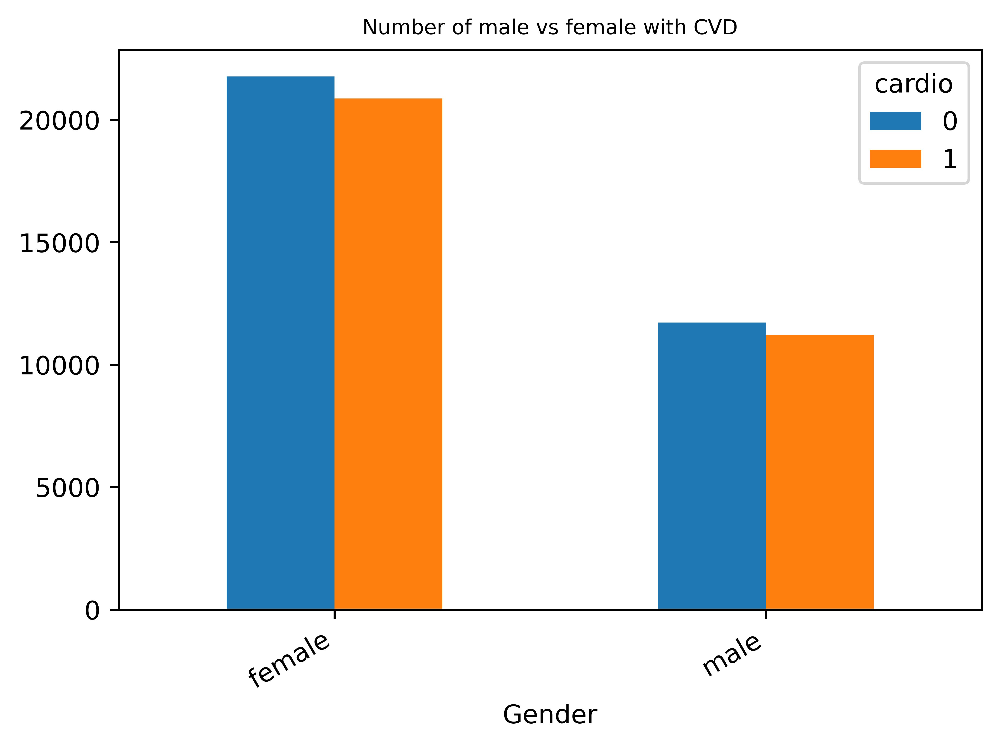

In [ ]:
df4.plot.bar()
plt.xticks(rotation=30,ha='right')
plt.title("Number of male vs female with CVD", fontsize=8);


In [ ]:
df.drop(df[(df['height'] > df['height'].quantile(0.975)) | (df['height'] < df['height'].quantile(0.025))].index,inplace=True)
df.drop(df[(df['weight'] > df['weight'].quantile(0.975)) | (df['weight'] < df['weight'].quantile(0.025))].index,inplace=True)

In [ ]:
df.drop(df[(df['ap_hi'] > df['ap_hi'].quantile(0.975)) | (df['ap_hi'] < df['ap_hi'].quantile(0.025))].index,inplace=True)
df.drop(df[(df['ap_lo'] > df['ap_lo'].quantile(0.975)) | (df['ap_lo'] < df['ap_lo'].quantile(0.025))].index,inplace=True)

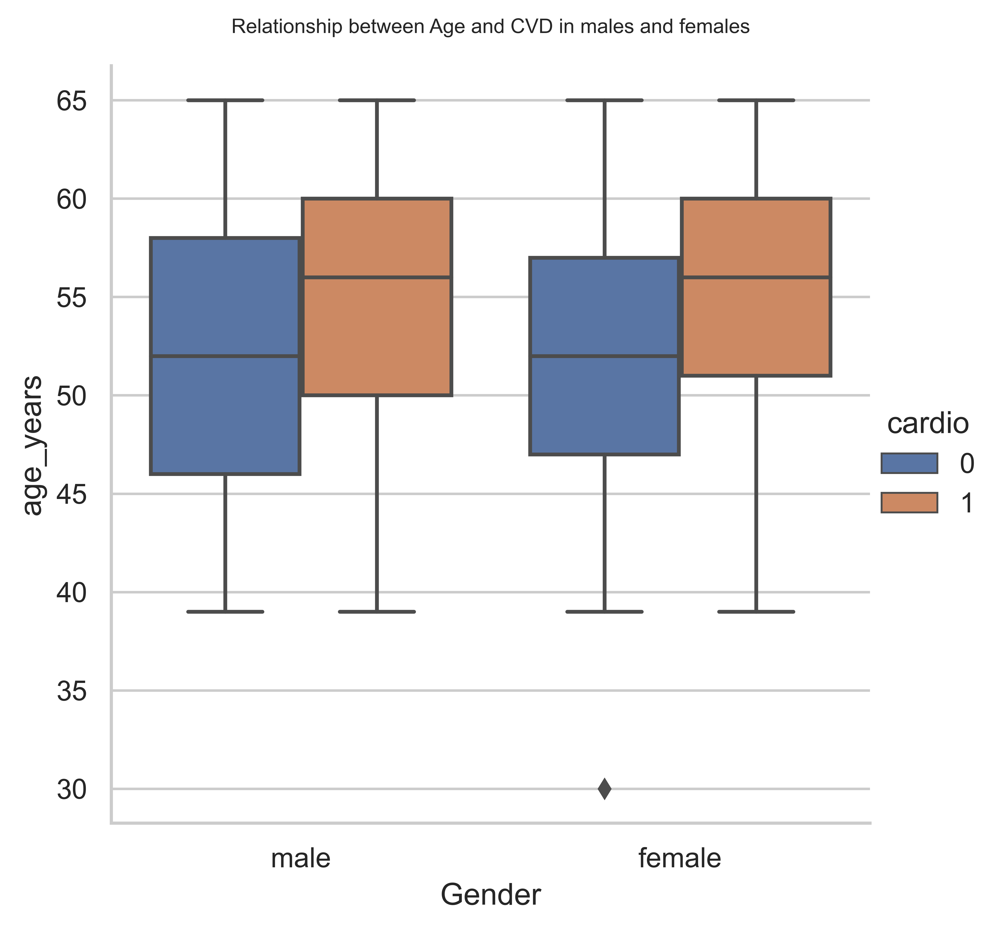

In [ ]:
#relationship between age and Cardio relative to gender
sns.set_style('ticks', {"axes.grid": True})

sns.set_style("whitegrid")

g = sns.catplot(
    data=df,
    x="Gender",
    y="age_years",
    kind="box",
    hue="cardio",
   # col="",
    #hue_order=[],
)

plt.title("Relationship between Age and CVD in males and females", fontsize=8, pad=13);

plt.rcParams['figure.dpi'] = 800
sns.set(font_scale = 1.5)


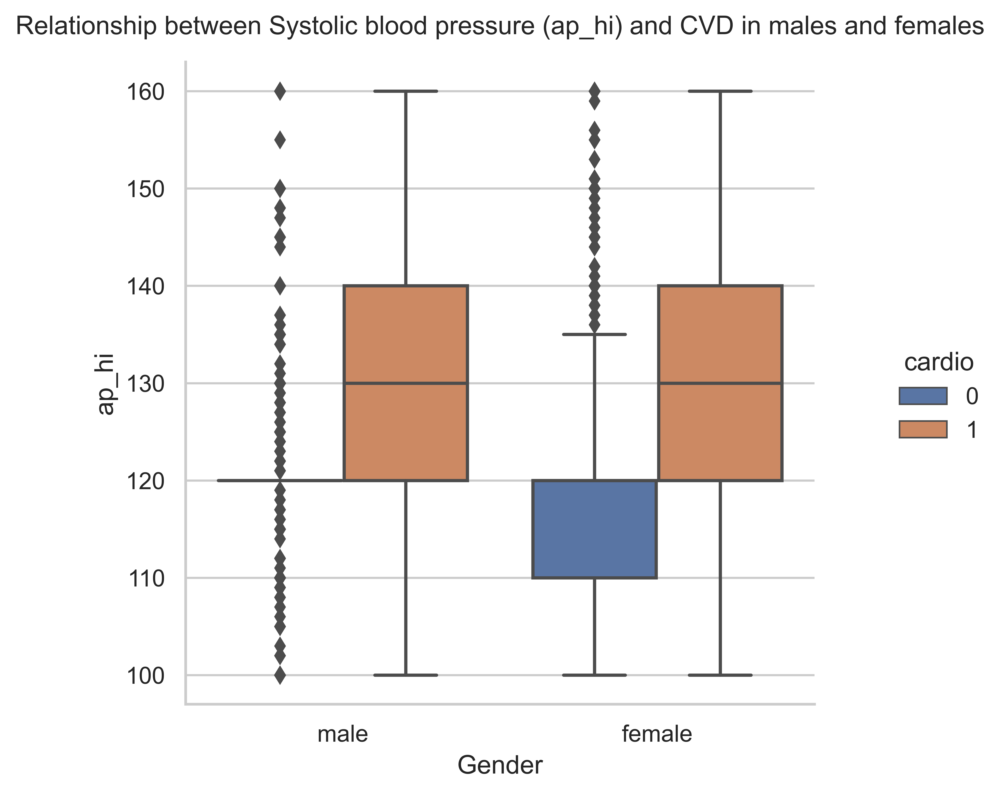

In [ ]:
#relationship between Systolic blood pressure and Cardio relative to gender
g = sns.catplot(
    data=df,
    x="Gender",
    y="ap_hi",
    kind="box",
    hue="cardio",
   # col="",
    #hue_order=[],
)

plt.title("Relationship between Systolic blood pressure (ap_hi) and CVD in males and females", fontsize=12, pad=13);

plt.rcParams['figure.dpi'] = 800

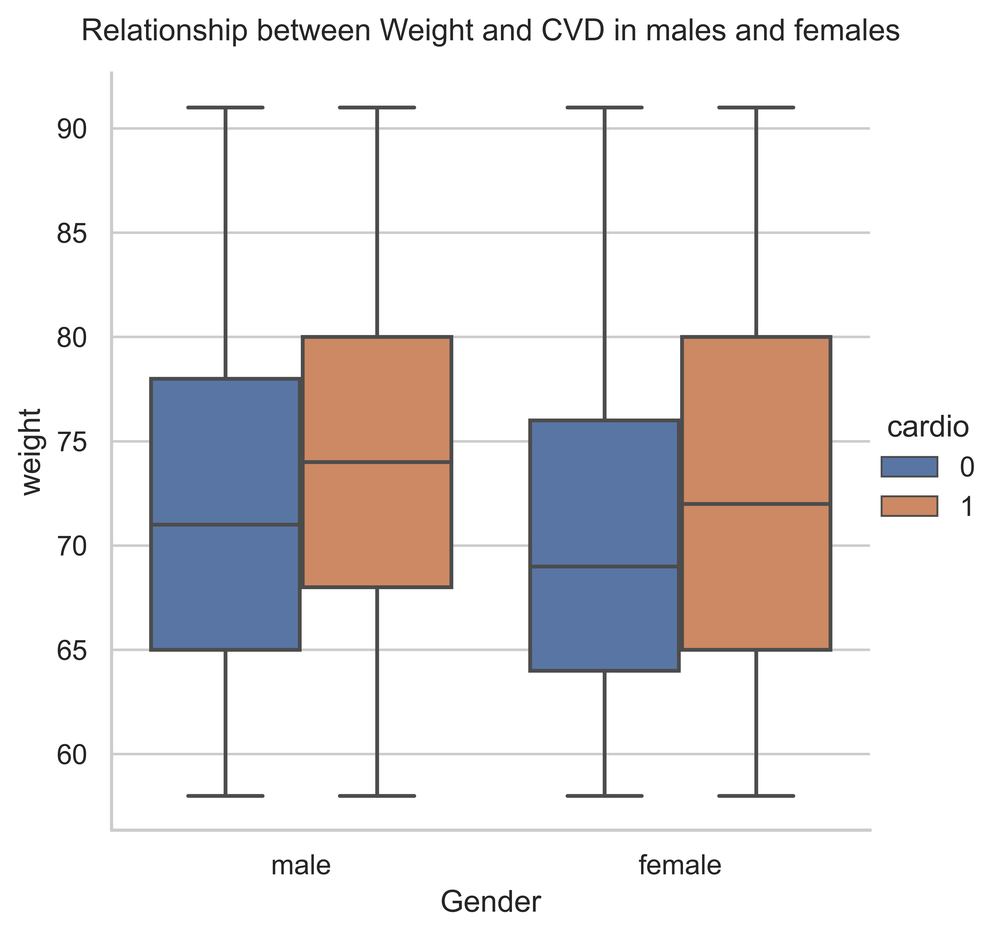

In [ ]:
#relationship between weight and Cardio relative to gender
g = sns.catplot(
    data=df,
    x="Gender",
    y="weight",
    kind="box",
    hue="cardio",
   # col="",
    #hue_order=[],
)

plt.title("Relationship between Weight and CVD in males and females", fontsize=12, pad=13);

plt.rcParams['figure.dpi'] = 800

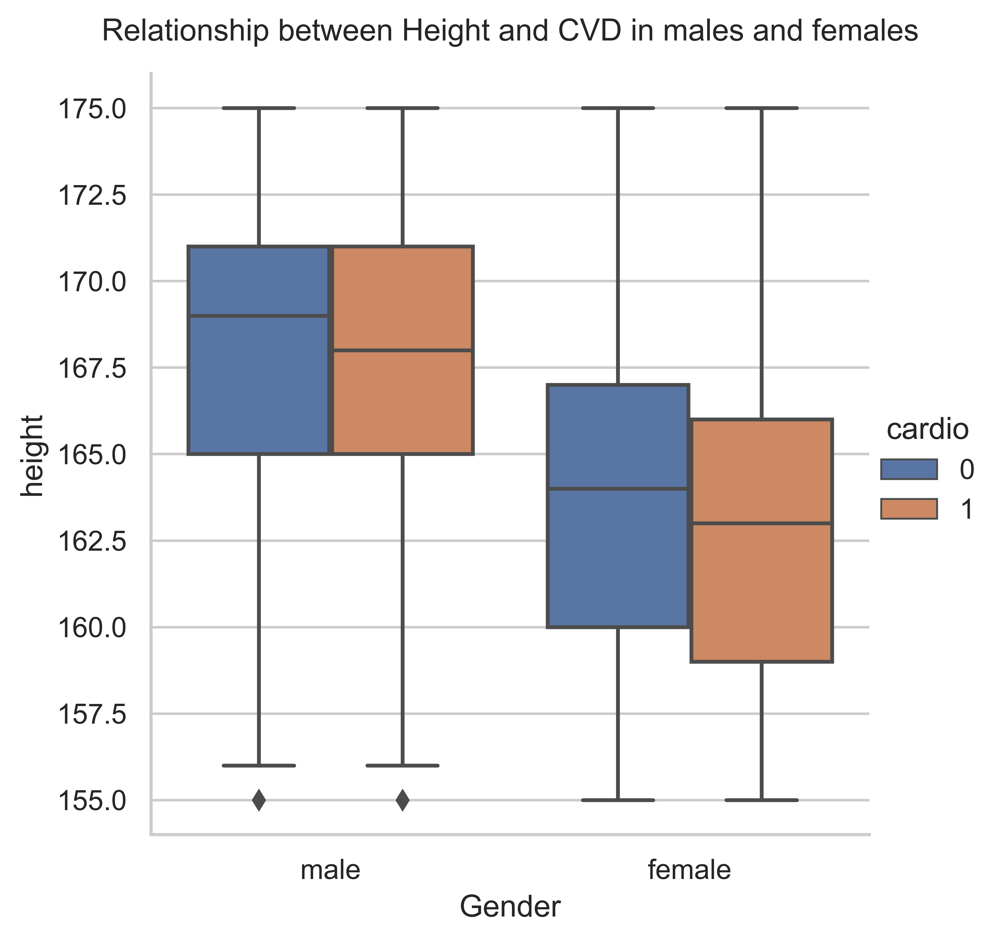

In [ ]:
#relationship between height and Cardio relative to gender
g = sns.catplot(
    data=df,
    x="Gender",
    y="height",
    kind="box",
    hue="cardio",
   # col="",
    #hue_order=[],
)

plt.title("Relationship between Height and CVD in males and females", fontsize=12, pad=13);

plt.rcParams['figure.dpi'] = 800

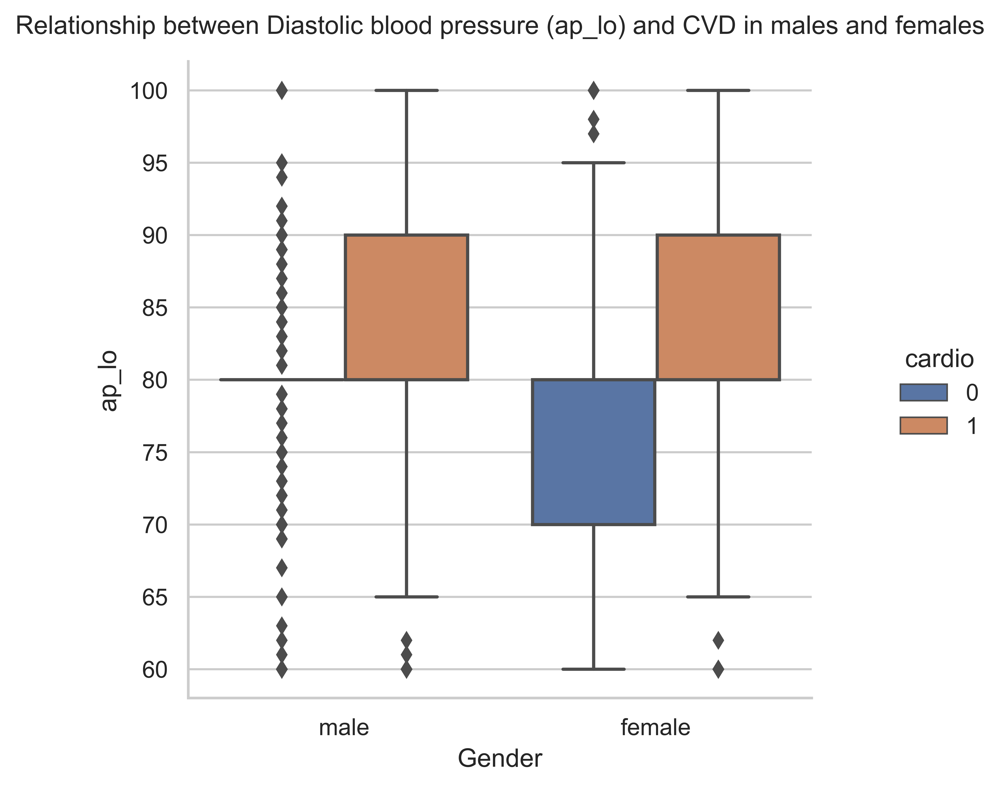

In [ ]:
#relationship between ap_lo and Cardio relative to gender
g = sns.catplot(
    data=df,
    x="Gender",
    y="ap_lo",
    kind="box",
    hue="cardio",
   # col="",
    #hue_order=[],
)

plt.title("Relationship between Diastolic blood pressure (ap_lo) and CVD in males and females", fontsize=12, pad=13);

plt.rcParams['figure.dpi'] = 800

In [ ]:
g = sns.relplot(
    data=df,
    x="BMI",
    y="age_years",
    aspect=2,
    hue="Gender",
    #kind="swarm",
    row="cardio_names",
)

# we need suptitle rather than just title as we want it to apply to the whole plot
g.fig.suptitle(
    "", y=1.05
)

Text(0.5, 1.05, '')

Age is measured in days, height is in centimeters. Let's look ate the numerical variables and how are they spread among target class. For example, at what age does the number of people with CVD exceed the number of people without CVD?

It can be observed that people over 55 of age are more exposed to CVD. From the table above, we can see that there are outliers in `ap_hi`, `ap_lo`, `weight` and `height`. We will deal with them later.

Let's look at categorical variables in the dataset and their distribution:

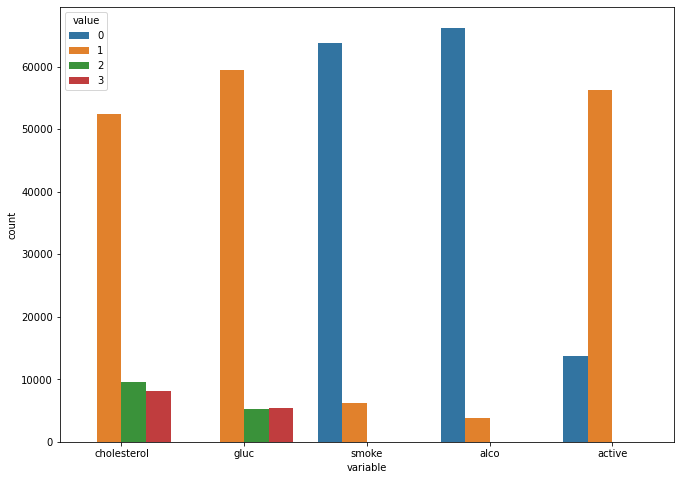

In [ ]:
df_categorical = df.loc[:,['cholesterol','gluc', 'smoke', 'alco', 'active']]
sns.countplot(x="variable", hue="value",data= pd.melt(df_categorical));

#### Bivariate analysis

It may be useful to split categorical variables by target class:

In [ ]:
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,years,BMI
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0,50,21.967120
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,55,34.927679
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,52,23.507805
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1,48,28.710479
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0,48,23.011177


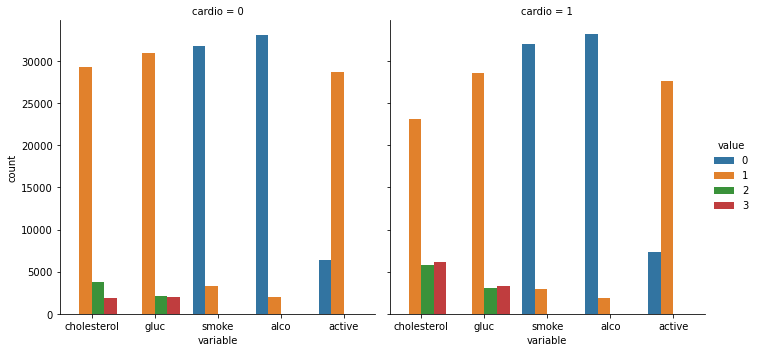

In [ ]:
df_long = pd.melt(df, id_vars=['cardio'], value_vars=['cholesterol','gluc', 'smoke', 'alco', 'active'])
sns.catplot(x="variable", hue="value", col="cardio",
                data=df_long, kind="count");

It can be clearly seen that patients with CVD have higher cholesterol and blood glucose level. And, generally speaking less active.

To figure out whether "1" stands for women or men in gender column, let's calculate the mean of height per gender. We assume that men are higher than women on average.

In [ ]:
df.groupby('gender')['height'].mean()

gender
1    162.055434
2    169.251915
Name: height, dtype: float64

Average height for "2" gender is greater, than for "1" gender, therefore "1" stands for women. Let's see how many men and women presented in the dataset:

In [ ]:
df['gender'].value_counts()

1    39254
2    20888
Name: gender, dtype: int64

Who more often report consuming alcohol - men or women?

In [ ]:
df.groupby('gender')['alco'].sum()

gender
1    1161
2    2603
Name: alco, dtype: int64

So, men consume alcohol more frequently on average. 
Next, the target variables are balanced:`

In [ ]:
df['cardio'].value_counts(normalize=True)

0    0.5003
1    0.4997
Name: cardio, dtype: float64

To see how the target class is distributed among men and women, we can use also `crosstab`

In [ ]:
pd.crosstab(df['cardio'],df['gender'],normalize=True)

gender,1,2
cardio,,
0,0.327343,0.172957
1,0.323086,0.176614


### Cleaning Data

Are there any `NA`s or missing values in a dataset?

In [ ]:
df.isnull().values.any()

False

If we look more closely to height and weight columns, we will notice that minimum height is 55 cm and minimum weight is 10 kg. That has to be an error, since minimum age is 10798 days, which equals to 29 years. On the other hand, the maximum height is 250 cm and the highest weight is 200 kg, which might be irrelevant, when generilizing data. To deal with these errors, we can remove outliers.

In [ ]:
df.describe()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,years
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,49972.419900,19468.865814,1.349571,164.359229,74.205690,128.817286,96.630414,1.366871,1.226457,0.088129,0.053771,0.803729,0.499700,53.338686
std,28851.302323,2467.251667,0.476838,8.210126,14.395757,154.011419,188.472530,0.680250,0.572270,0.283484,0.225568,0.397179,0.500003,6.765294
min,0.000000,10798.000000,1.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,30.000000
25%,25006.750000,17664.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,48.000000
50%,50001.500000,19703.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,54.000000
75%,74889.250000,21327.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000,58.000000
max,99999.000000,23713.000000,2.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000,65.000000


Let's remove weights and heights, that fall below 2.5% or above 97.5% of a given range.

In [ ]:
df.drop(df[(df['height'] > df['height'].quantile(0.975)) | (df['height'] < df['height'].quantile(0.025))].index,inplace=True)
df.drop(df[(df['weight'] > df['weight'].quantile(0.975)) | (df['weight'] < df['weight'].quantile(0.025))].index,inplace=True)

In addition, in some cases diastolic pressure is higher than systolic, which is also  incorrect. How many records are inaccurate in terms of blood pressure?

In [ ]:
print("Diastilic pressure is higher than systolic one in {0} cases".format(df[df['ap_lo']> df['ap_hi']].shape[0]))

Diastilic pressure is higher than systolic one in 1082 cases


Let's get rid of the outliers, moreover blood pressure could not be negative value!

In [ ]:
df.drop(df[(df['ap_hi'] > df['ap_hi'].quantile(0.975)) | (df['ap_hi'] < df['ap_hi'].quantile(0.025))].index,inplace=True)
df.drop(df[(df['ap_lo'] > df['ap_lo'].quantile(0.975)) | (df['ap_lo'] < df['ap_lo'].quantile(0.025))].index,inplace=True)

Diastilic pressure is higher than systolic one in 0 cases


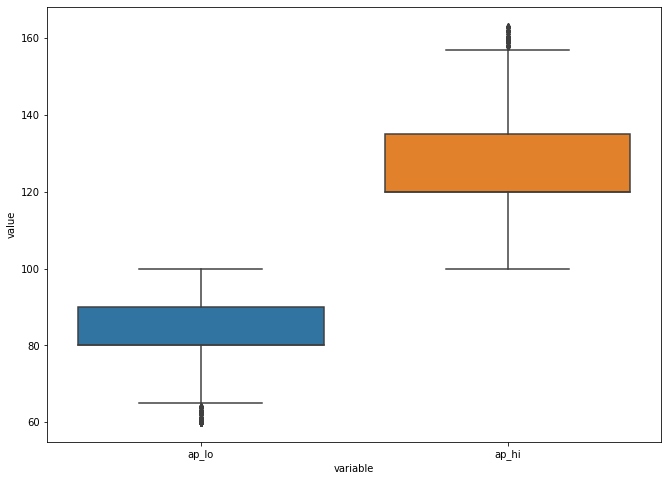

In [ ]:
blood_pressure = df.loc[:,['ap_lo','ap_hi']]
sns.boxplot(x = 'variable',y = 'value',data = blood_pressure.melt())
print("Diastilic pressure is higher than systolic one in {0} cases".format(df[df['ap_lo']> df['ap_hi']].shape[0]))

#### Multivariate analysis
It might be useful to consider correlation matrix:

In [1]:
corr = df.corr()
cmap = sns.diverging_palette(220, 10, as_cmap=True)
# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,annot = True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5});

NameError: ignored

As we can see age and cholesterol have significant impact, but not very high correlated with target class.

Let's create `violinplot` to show height distribution across gender. Looking at the mean values of height and weight for each value of the gender feature might not be enough to determin whether 1 is male or female designation.

In [ ]:
import warnings
warnings.filterwarnings("ignore")
df_melt = pd.melt(frame=df, value_vars=['height'], id_vars=['gender'])
plt.figure(figsize=(12, 10))
ax = sns.violinplot(
    x='variable', 
    y='value', 
    hue='gender', 
    split=True, 
    data=df_melt, 
    scale='count',
    scale_hue=False,
    palette="Set2");

Let's create a new feature - Body Mass Index (BMI):

$$BMI = \frac {mass_{kg}} {height ^2_{m}},$$

and compare average BMI for healthy people to average BMI of ill people. Normal BMI values are said to be from 18.5 to 25.

In [ ]:
sns.set_style('ticks', {"axes.grid": True})
sns.set(font_scale = 2)


sns.set_style("whitegrid")

df['BMI'] = df['weight']/((df['height']/100)**2)
sns.catplot(x="Gender", y="BMI", hue="alco", col="CVD status", 
            data=df, color = "lightblue",kind="box", height=10, aspect=.7);

In [ ]:
sns.set_style('ticks', {"axes.grid": True})
sns.set(font_scale = 2)


sns.set_style("whitegrid")

df['BMI'] = df['weight']/((df['height']/100)**2)
sns.catplot(x="Gender", y="BMI", hue="cholesterol", col="CVD status", 
            data=df, color = "red",kind="box", height=10, aspect=.7);

In [ ]:
sns.set_style('ticks', {"axes.grid": True})
sns.set(font_scale = 2)


sns.set_style("whitegrid")

df['BMI'] = df['weight']/((df['height']/100)**2)
sns.catplot(x="Gender", y="age_years", hue="cholesterol", col="CVD status", 
            data=df, color = "yellow",kind="box", height=10, aspect=.7);

 Drinking women have higher risks for CVD than drinking men based on thier BMI.

*To be continued*

In [ ]:
df.head()

In [ ]:
duplicate_sum = df.duplicated().sum()
if duplicate_sum:
    print('Duplicates Rows in Dataset are : {}'.format(duplicate_sum))
else:
    print('Dataset contains no Duplicate Values')

In [ ]:
duplicated = df[df.duplicated(keep=False)]
duplicated = duplicated.sort_values(by=['gender', 'height', 'weight'], ascending= False)
duplicated.head()

In [ ]:
df.drop_duplicates(keep = 'first', inplace = True)
print('Total {} datapoints remaining with {} features'.format(df.shape[0], df.shape[1]))


In [ ]:
Continuous_features = [feature for feature in df.columns if len(df[feature].unique())>25]
print('Continuous Values are : {}'.format(Continuous_features))

In [ ]:
df[Continuous_features].head()


In [ ]:
fig = go.Figure([go.Pie(labels=['Not Having CVD', 'Having CVD'],values=cleaned_data['cardio'].value_counts().values)])
fig.update_layout(title_text="Pie chart of Target Variable", template="plotly_white")
fig.data[0].marker.line.color = 'rgb(255, 255, 255)'
fig.data[0].marker.line.width = 2
fig.update_traces(hole=.4,)
fig.show()